In [1]:
!pip install lime
!pip install shap
!pip install imblearn

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as s
import matplotlib.pyplot as plt
#sns.set(style = 'whitegrid')
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import classification_report

from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm

from sklearn.metrics import confusion_matrix,precision_score,f1_score,cohen_kappa_score,accuracy_score

from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.metrics import plot_confusion_matrix,plot_roc_curve,roc_auc_score,roc_curve

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,StackingClassifier

from xgboost import XGBClassifier

import pydotplus

from IPython.display import Image

import os
#os.environ["PATH"] += os.pathsep + 'C:\Users\Lenovo\anaconda3\Library\bin'

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV, cross_val_score

import lime
from lime import lime_tabular

import shap

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [3]:
!pip install mlxtend

1. **[Decision Tree](#dtree)**

## Cleaning the Data

In [4]:
data = pd.read_csv("D:\My Downloads\storedata_total.csv")
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,28/9/2012,11/8/2013,11/8/2013,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,19/12/2010,1/4/2011,19/1/2014,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,3/10/2010,1/12/2010,6/7/2011,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,22/10/2010,28/3/2011,28/3/2011,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,27/11/2010,29/11/2010,28/1/2013,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


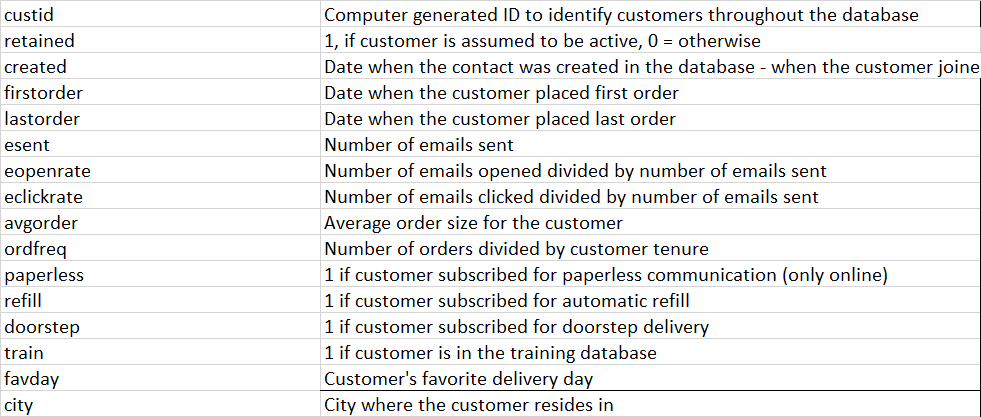

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   custid      30781 non-null  object 
 1   retained    30801 non-null  int64  
 2   created     30781 non-null  object 
 3   firstorder  30781 non-null  object 
 4   lastorder   30781 non-null  object 
 5   esent       30801 non-null  int64  
 6   eopenrate   30801 non-null  float64
 7   eclickrate  30801 non-null  float64
 8   avgorder    30801 non-null  float64
 9   ordfreq     30801 non-null  float64
 10  paperless   30801 non-null  int64  
 11  refill      30801 non-null  int64  
 12  doorstep    30801 non-null  int64  
 13  favday      30801 non-null  object 
 14  city        30801 non-null  object 
dtypes: float64(4), int64(5), object(6)
memory usage: 3.5+ MB


In [6]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000


In [6]:
data.isnull().sum()

custid        20
retained       0
created       20
firstorder    20
lastorder     20
esent          0
eopenrate      0
eclickrate     0
avgorder       0
ordfreq        0
paperless      0
refill         0
doorstep       0
favday         0
city           0
dtype: int64

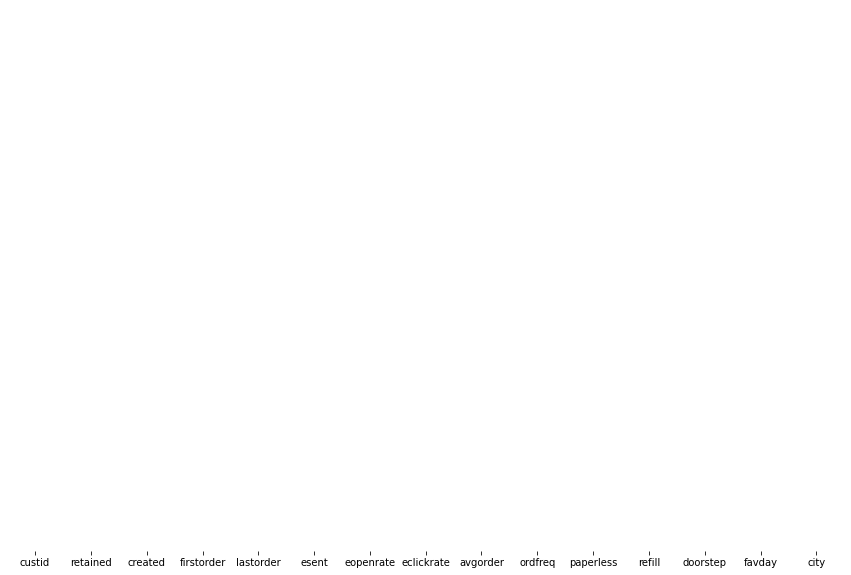

In [7]:
plt.figure(figsize=(15,10))
sns.heatmap(data.isnull(),cmap='binary',cbar=False,yticklabels=False);

In [8]:
data.fillna(method='bfill',inplace=True)

In [9]:
data.isnull().sum()

custid        0
retained      0
created       0
firstorder    0
lastorder     0
esent         0
eopenrate     0
eclickrate    0
avgorder      0
ordfreq       0
paperless     0
refill        0
doorstep      0
favday        0
city          0
dtype: int64

In [10]:
first_ord = []
for i in range(0,len(data)):
    if i in data[(data.firstorder == '1/0/00')].index:
        first_ord.append(data.created[i])
    else:
        first_ord.append(data.firstorder[i])
data['firstorder'] = first_ord

last_ord = []
for i in range(0,len(data)):
    if i in data[data.lastorder == '1/0/00'].index:
        last_ord.append(data.firstorder[i])
    else:
        last_ord.append(data.lastorder[i])
data['lastorder'] = last_ord

In [11]:
data.to_csv('Store_Data_after_EDA.csv',index=False)

### Reading the cleaned data

In [12]:
data = pd.read_csv('Store_Data_after_EDA.csv')

#data = data.drop(columns=['Unnamed: 0', 'index'],axis=1)
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,28/9/2012,11/8/2013,11/8/2013,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,19/12/2010,1/4/2011,19/1/2014,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,3/10/2010,1/12/2010,6/7/2011,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,22/10/2010,28/3/2011,28/3/2011,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,27/11/2010,29/11/2010,28/1/2013,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


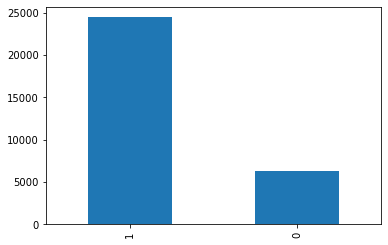

In [13]:
data.retained.value_counts().plot(kind='bar')
plt.show()

In [23]:
# The data is imbalanced.

### Changing the columns into datetime

In [14]:
data['firstorder']= data.firstorder.astype('datetime64')
data['lastorder'] = data.lastorder.astype('datetime64')
data['created'] = data.created.astype('datetime64')

In [15]:
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,2012-09-28,2013-11-08,2013-11-08,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,2010-12-19,2011-01-04,2014-01-19,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,2010-03-10,2010-01-12,2011-06-07,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,2010-10-22,2011-03-28,2011-03-28,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,2010-11-27,2010-11-29,2013-01-28,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


### Data information

In [16]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   custid      30801 non-null  object        
 1   retained    30801 non-null  int64         
 2   created     30801 non-null  datetime64[ns]
 3   firstorder  30801 non-null  datetime64[ns]
 4   lastorder   30801 non-null  datetime64[ns]
 5   esent       30801 non-null  int64         
 6   eopenrate   30801 non-null  float64       
 7   eclickrate  30801 non-null  float64       
 8   avgorder    30801 non-null  float64       
 9   ordfreq     30801 non-null  float64       
 10  paperless   30801 non-null  int64         
 11  refill      30801 non-null  int64         
 12  doorstep    30801 non-null  int64         
 13  favday      30801 non-null  object        
 14  city        30801 non-null  object        
dtypes: datetime64[ns](3), float64(4), int64(5), object(3)
memory usage: 3.

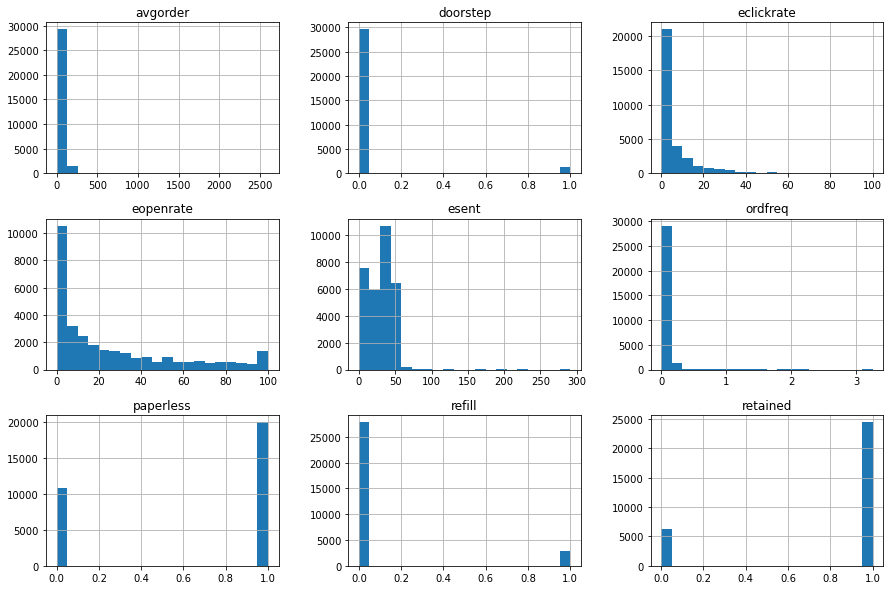

In [18]:
data.hist(bins=20,figsize=(15,10))
plt.show()

In [19]:
data['create_first'] = data.firstorder - data.created
data['create_first'] = data['create_first']/np.timedelta64(1,'D')
data['first_last'] = data.lastorder - data.firstorder
data['first_last'] = data['first_last']/np.timedelta64(1,'D')

In [20]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,create_first,first_last
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895,33.224928,86.716081
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347,548.935337,621.712708
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-41494.000000,-41555.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000,31.000000,61.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000,2262.000000,2105.000000


In [21]:
data = data.drop(['ordfreq','custid'],axis=1)

In [22]:
data = data.drop(['firstorder','lastorder','created'],axis=1)

In [23]:
data.head()

,retained,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
0,0,29,100.000000,3.448276,14.52,0,0,0,Monday,DEL,406.0,0.0
1,1,95,92.631579,10.526316,83.69,1,1,1,Friday,DEL,16.0,1111.0
2,0,0,0.000000,0.000000,33.58,0,0,0,Wednesday,DEL,-57.0,511.0
3,0,0,0.000000,0.000000,54.96,0,0,0,Thursday,BOM,157.0,0.0
4,1,30,90.000000,13.333333,111.91,0,0,0,Monday,BOM,2.0,791.0


### Test-Train Split

In [24]:
inp = data.drop('retained',axis=1)
out = data.retained
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(inp,out,test_size=0.3,random_state=12)

### Outlier Treatment

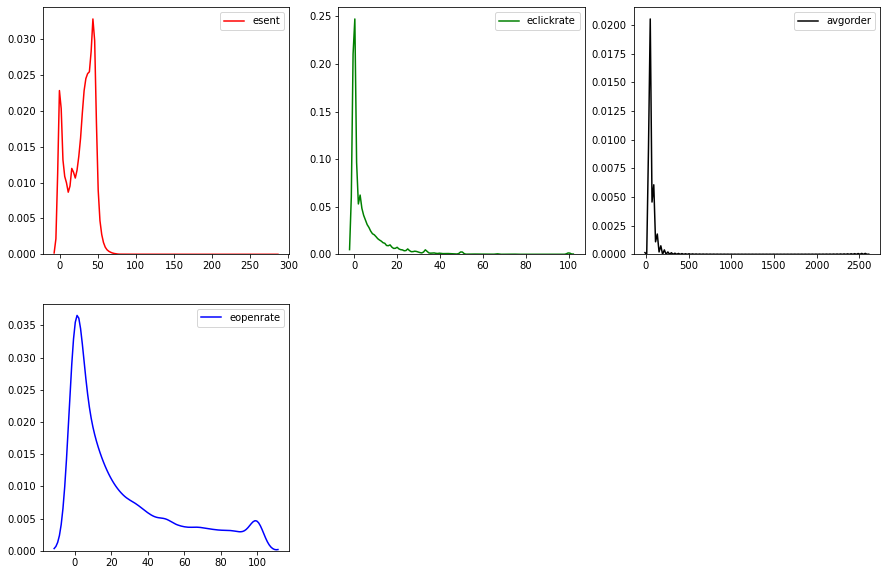

In [25]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(data.avgorder,color='black')
plt.subplot(2,3,4)
sns.kdeplot(data.eopenrate,color='blue')
plt.show()

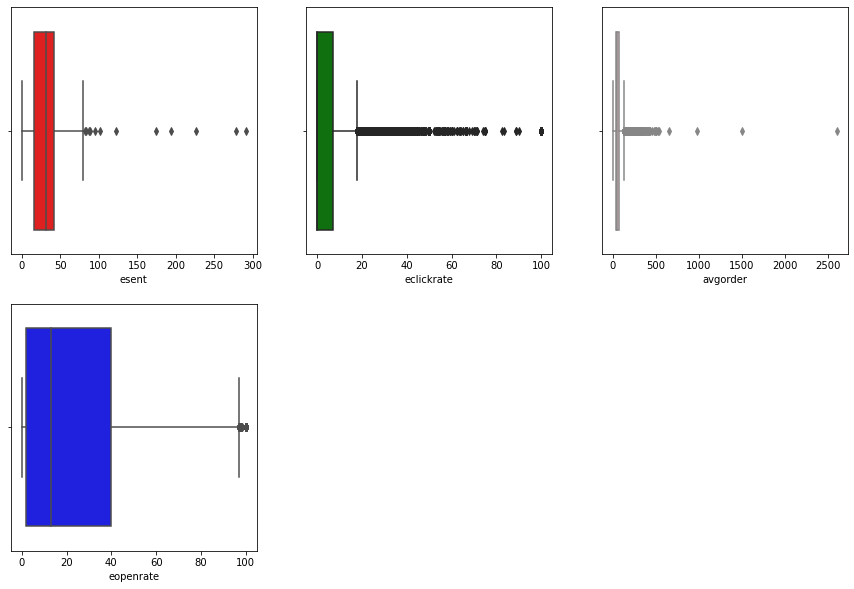

In [41]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = data.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.boxplot(x = data.avgorder,color='pink')
plt.subplot(2,3,4)
sns.boxplot(data.eopenrate,color='blue')
plt.show()

In [26]:
def impute(x):
    for i in x.columns:
        iqr = 1.5*(x[i].quantile(0.75) - x[i].quantile(0.25))
        ul = x[i].quantile(0.75) + iqr
        ll = x[i].quantile(0.25) - iqr
        temp = []
        for j in x[i].index:
            if x[i][j] > ul or x[i][j] < ll :
                temp.append(np.median(x[i]))
            elif x[i][j] < 0:
                temp.append(0)
            else:
                temp.append(x[i][j])
        x[i]= temp
    return x

In [27]:
xtrain[['esent','eclickrate','avgorder','eopenrate']] = impute(xtrain[['esent','eclickrate','avgorder','eopenrate']])
xtest[['esent','eclickrate','avgorder','eopenrate']] = impute(xtest[['esent','eclickrate','avgorder','eopenrate']])

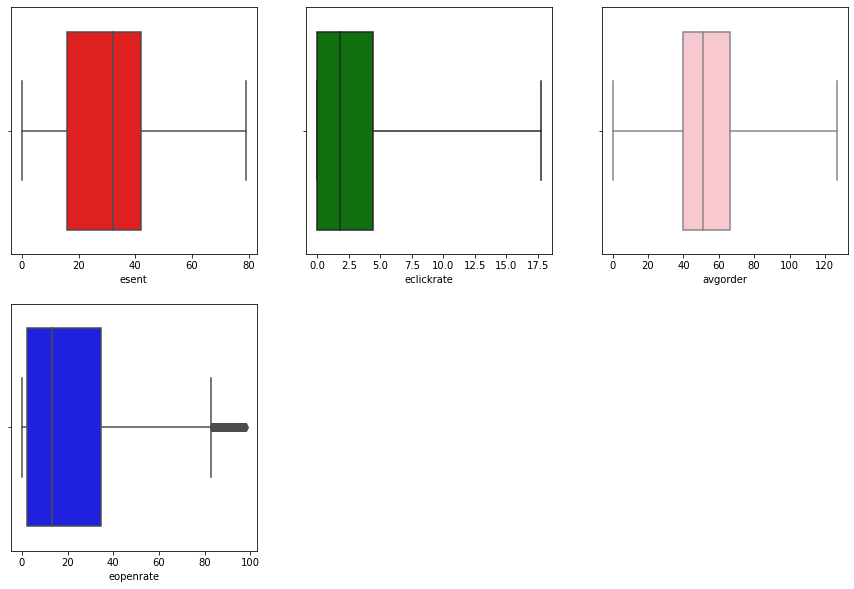

In [28]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = xtrain.eclickrate,color='green',whis=6)
plt.subplot(2,3,3)
sns.boxplot(x = xtrain.avgorder,color='pink',whis=3)
plt.subplot(2,3,4)
sns.boxplot(xtrain.eopenrate,color='blue')
plt.show()

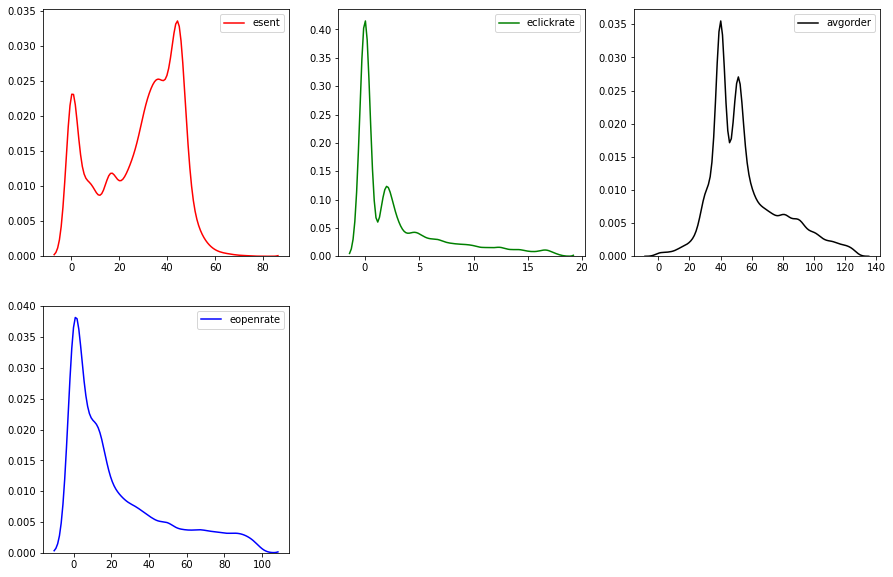

In [45]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(xtrain.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(xtrain.avgorder,color='black')
#plt.subplot(2,3,4)
#sns.kdeplot(xtrain.ordfreq,color='orange')
plt.subplot(2,3,4)
sns.kdeplot(xtrain.eopenrate,color='blue')
plt.show()

In [29]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,28.134647,22.486722,2.954306,55.275783,0.648840,0.094017,0.039100,36.477134,91.347588
std,16.502098,25.799586,4.249084,22.770930,0.477344,0.291859,0.193838,426.108487,543.510384
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-41494.000000,-41491.000000
25%,16.000000,2.127660,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32.000000,13.333333,1.785714,51.120000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,42.000000,34.498433,4.444444,66.522500,1.000000,0.000000,0.000000,31.000000,63.000000
max,79.000000,98.000000,17.777778,126.570000,1.000000,1.000000,1.000000,2091.000000,2015.000000


## Data Visualization

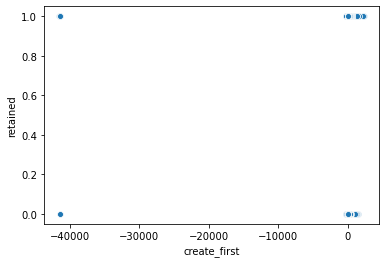

In [30]:
sns.scatterplot(x = data.create_first, y = data.retained)

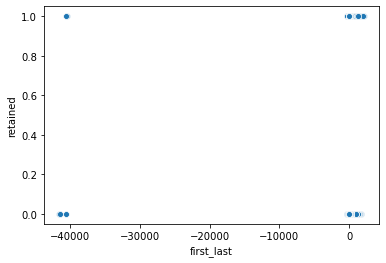

In [31]:
sns.scatterplot(x = data.first_last, y = data.retained)

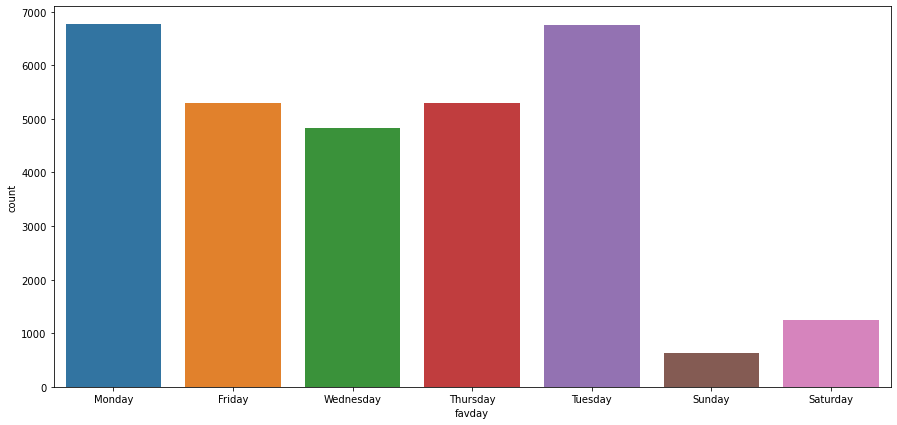

In [32]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.favday)
plt.show()

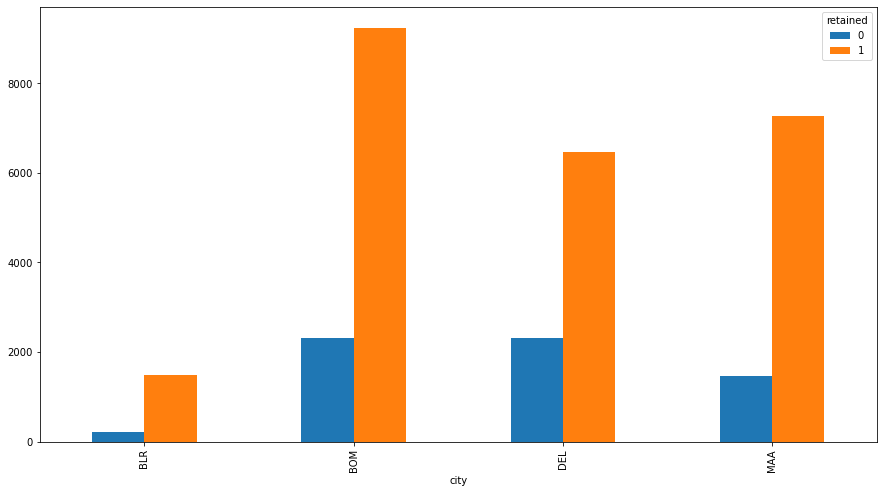

In [33]:
pd.crosstab(index=data.city,columns=data.retained).plot(kind='bar',figsize=(15,8))

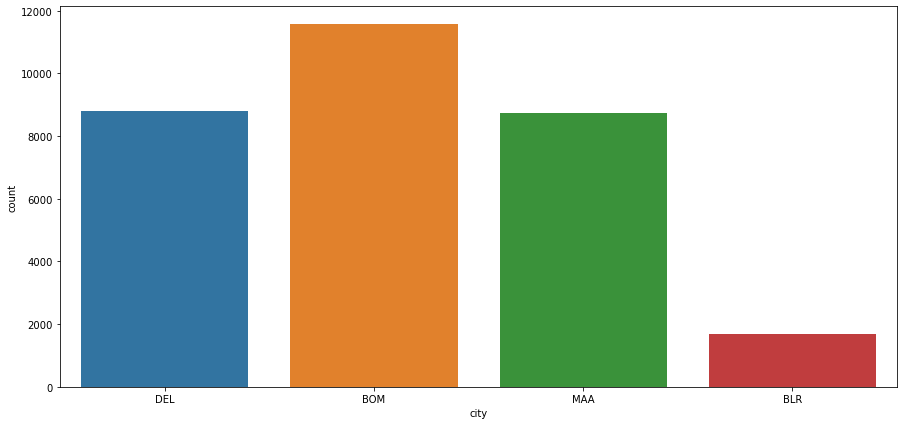

In [34]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.city)
plt.show()

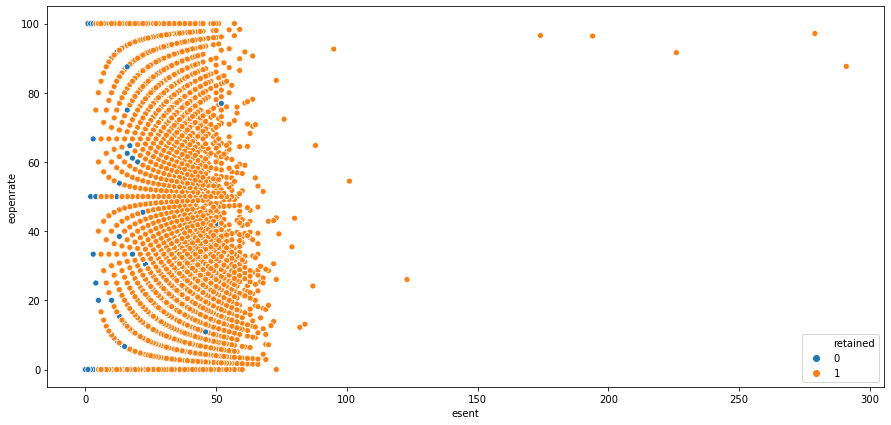

In [35]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eopenrate, hue= data.retained)
plt.show()

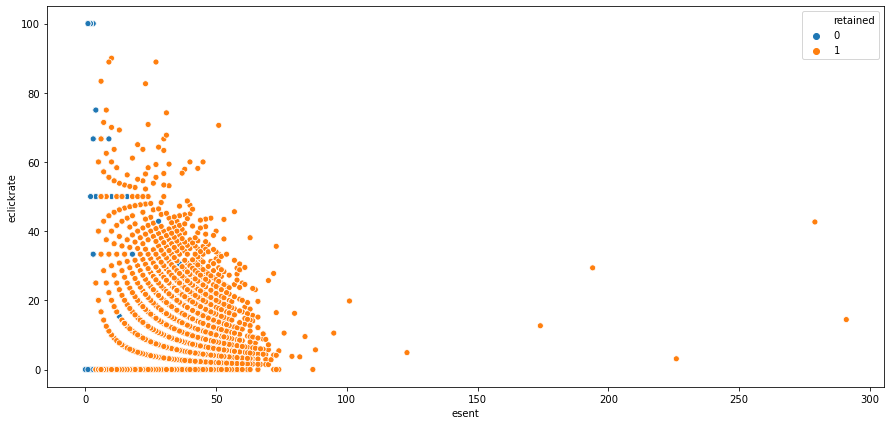

In [36]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eclickrate, hue= data.retained)
plt.show()

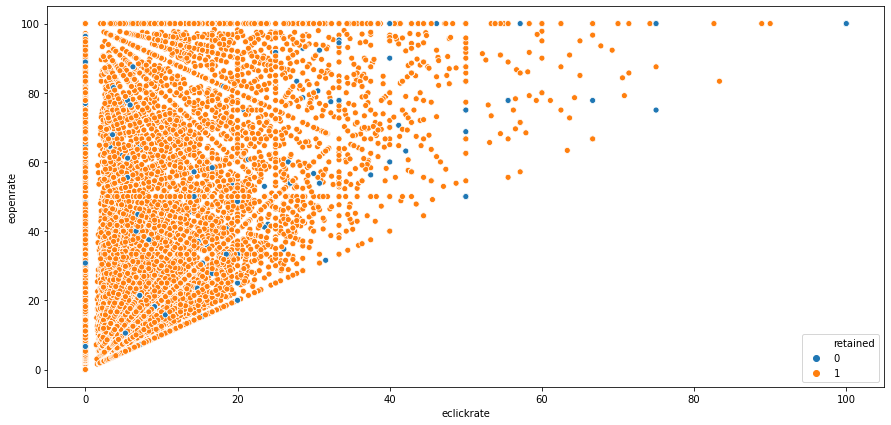

In [54]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.eclickrate, y = data.eopenrate, hue= data.retained)
plt.show()

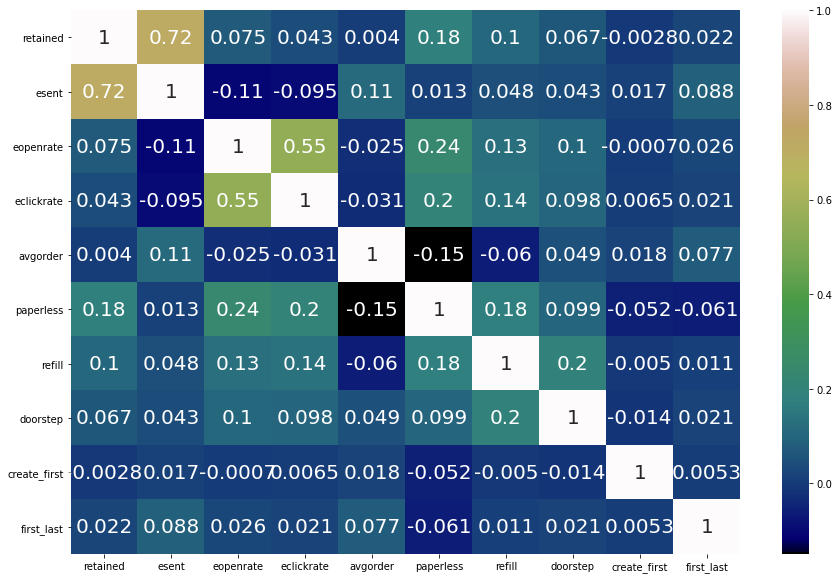

In [37]:
plt.figure(figsize=(15,10))
sns.heatmap(data.corr(),annot=True,annot_kws={'size':20}, cmap = 'gist_earth');

In [38]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,45.0,4.444444,2.222222,79.24,1,0,0,Thursday,BLR,22.0,0.0
30419,16.0,31.250000,6.250000,40.02,1,0,0,Tuesday,DEL,0.0,0.0
19590,30.0,0.000000,0.000000,51.05,1,0,0,Friday,MAA,0.0,0.0
27767,7.0,14.285714,0.000000,40.02,1,0,0,Friday,BOM,0.0,0.0
632,40.0,20.000000,7.500000,51.97,0,0,0,Thursday,MAA,14.0,0.0


In [39]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,34.0,41.176471,0.0,40.02,1,0,0,Friday,DEL,0.0,0.0
24420,6.0,50.000000,0.0,40.02,1,1,0,Thursday,MAA,0.0,0.0
4877,40.0,10.000000,7.5,69.58,0,0,0,Thursday,MAA,420.0,0.0
26361,47.0,2.127660,0.0,93.96,0,0,0,Wednesday,DEL,22.0,447.0
26882,46.0,26.086957,0.0,36.51,0,1,0,Friday,BOM,468.0,344.0


## Transformation

In [40]:
xtrain['avgorder'] = s.boxcox(xtrain.avgorder+1)[0]

In [42]:
xtrain['esent'] = s.boxcox(xtrain.esent+1)[0]

In [43]:
xtrain['eopenrate'] = s.boxcox(xtrain.eopenrate+1)[0]

In [44]:
xtrain['eclickrate'] = s.boxcox(xtrain.eclickrate+1)[0]

In [45]:
xtrain['create_first'] = s.boxcox(abs(xtrain.create_first)+1)[0]

In [47]:
xtrain['first_last'] = s.boxcox(abs(xtrain.first_last)+5)[0]

In [49]:
data.head()

,retained,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last,first_last1
0,0,29,100.000000,3.448276,14.52,0,0,0,Monday,DEL,406.0,0.0,0.0
1,1,95,92.631579,10.526316,83.69,1,1,1,Friday,DEL,16.0,1111.0,1111.0
2,0,0,0.000000,0.000000,33.58,0,0,0,Wednesday,DEL,-57.0,511.0,511.0
3,0,0,0.000000,0.000000,54.96,0,0,0,Thursday,BOM,157.0,0.0,0.0
4,1,30,90.000000,13.333333,111.91,0,0,0,Monday,BOM,2.0,791.0,791.0


In [68]:
xtrain['first_last'] = s.boxcox(xtrain.first_last1+1)[0]

AttributeError: 'DataFrame' object has no attribute 'first_last1'

In [50]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,27.966191,1.659453,0.564642,13.194962,1,0,0,Thursday,BLR,1.236567,1.107591
30419,11.517019,3.519177,0.702690,9.282062,1,0,0,Tuesday,DEL,0.000000,1.107591
19590,19.786506,0.000000,0.000000,10.543028,1,0,0,Friday,MAA,0.000000,1.107591
27767,5.584408,2.712785,0.000000,9.282062,1,0,0,Friday,BOM,0.000000,1.107591
632,25.297263,3.050576,0.721172,10.641026,0,0,0,Thursday,MAA,1.156880,1.107591


In [51]:
xtest['avgorder'] = s.boxcox(xtest.avgorder+1)[0]
xtest['esent'] = s.boxcox(xtest.esent+1)[0]
xtest['eopenrate'] = s.boxcox(xtest.eopenrate+1)[0]
xtest['eclickrate'] = s.boxcox(xtest.eclickrate+1)[0]
xtest['create_first'] = s.boxcox(abs(xtest.create_first)+1)[0]
xtest['first_last'] = s.boxcox(abs(xtest.first_last)+5)[0]

In [52]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,22.835287,4.770155,0.000000,9.158151,1,0,0,Friday,DEL,0.000000,1.073232
24420,4.958988,5.076936,0.000000,9.158151,1,1,0,Thursday,MAA,0.000000,1.073232
4877,26.281616,2.795733,1.059095,12.176130,0,0,0,Thursday,MAA,3.734967,1.073232
26361,30.206680,1.225493,0.000000,14.149353,0,0,0,Wednesday,DEL,2.415194,1.775560
26882,29.651606,4.082677,0.000000,8.724858,0,1,0,Friday,BOM,3.772250,1.765508


In [53]:
xtest.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000
mean,18.685202,2.897770,0.394975,10.470658,0.649497,0.097608,0.038416,1.482833,1.302665
std,10.457237,2.120561,0.488910,2.213639,0.477153,0.296801,0.192208,1.501147,0.306579
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.073232
25%,11.190128,0.000000,0.000000,9.158151,0.000000,0.000000,0.000000,0.000000,1.073232
50%,21.667047,3.075612,0.000000,10.353137,1.000000,0.000000,0.000000,0.999770,1.073232
75%,27.412806,4.725087,0.949377,11.728839,1.000000,0.000000,0.000000,3.051778,1.686726
max,47.723528,6.242608,1.173694,16.150839,1.000000,1.000000,1.000000,4.835985,1.836525


In [54]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,18.100666,2.316842,0.326698,10.723216,0.648840,0.094017,0.039100,0.718622,1.380222
std,10.010254,1.588885,0.331978,2.299414,0.477344,0.291859,0.193838,0.672663,0.353249
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.107591
25%,11.517019,1.114488,0.000000,9.282062,0.000000,0.000000,0.000000,0.000000,1.107591
50%,20.909715,2.645244,0.528258,10.550518,1.000000,0.000000,0.000000,0.805233,1.107591
75%,26.370965,3.626088,0.663575,12.077880,1.000000,0.000000,0.000000,1.407220,1.809990
max,45.073923,4.821671,0.789022,16.643378,1.000000,1.000000,1.000000,1.797474,2.000356


## Scaling

In [55]:
SS = StandardScaler()

In [56]:
a = SS.fit_transform(xtrain[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])

In [57]:
xtrain['eclickrate'] = a[:,0]
xtrain['eopenrate'] = a[:,1]
xtrain['eclickrate'] = a[:,2]
xtrain['avgorder'] = a[:,3]
xtrain['esent'] = a[:,4]
xtrain['create_first'] = a[:,5]
xtrain['first_last'] = a[:,6]

In [58]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,0.985565,-0.413752,0.716764,1.074971,1,0,0,Thursday,BLR,0.770010,-0.771798
30419,-0.657706,0.756734,1.132608,-0.626763,1,0,0,Tuesday,DEL,-1.068348,-0.771798
19590,0.168415,-1.458190,-0.984118,-0.078365,1,0,0,Friday,MAA,-1.068348,-0.771798
27767,-1.250373,0.249202,-0.984118,-0.626763,1,0,0,Friday,BOM,-1.068348,-0.771798
632,0.718939,0.461803,1.188284,-0.035745,0,0,0,Thursday,MAA,0.651542,-0.771798


In [59]:
b = SS.transform(xtest[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])
b

array([[-0.98411815,  1.54408265, -0.98411815, ...,  0.47298808,
        -1.06834796, -0.8690669 ],
       [-0.98411815,  1.73716674, -0.98411815, ..., -1.31285215,
        -1.06834796, -0.8690669 ],
       [ 2.20621383,  0.30140762,  2.20621383, ...,  0.8172759 ,
         4.48428872, -0.8690669 ],
       ...,
       [-0.98411815, -1.45818955, -0.98411815, ...,  0.05958939,
        -1.06834796, -0.8690669 ],
       [ 2.22942617,  1.0902511 ,  2.22942617, ...,  1.42947858,
         3.75178409,  0.90137139],
       [-0.98411815, -0.65388329, -0.98411815, ...,  1.04248867,
         3.24443897, -0.8690669 ]])

In [60]:
xtest['eclickrate'] = b[:,0]
xtest['eopenrate'] = b[:,1]
xtest['eclickrate'] = b[:,2]
xtest['avgorder'] = b[:,3]
xtest['esent'] = b[:,4]
xtest['create_first'] = b[:,5]
xtest['first_last'] = b[:,6]

In [61]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,0.472988,1.544083,-0.984118,-0.680653,1,0,0,Friday,DEL,-1.068348,-0.869067
24420,-1.312852,1.737167,-0.984118,-0.680653,1,1,0,Thursday,MAA,-1.068348,-0.869067
4877,0.817276,0.301408,2.206214,0.631878,0,0,0,Thursday,MAA,4.484289,-0.869067
26361,1.209389,-0.686881,-0.984118,1.490039,0,0,0,Wednesday,DEL,2.522231,1.119173
26882,1.153938,1.111394,-0.984118,-0.869093,0,1,0,Friday,BOM,4.539716,1.090718


## One Hot Encoding

In [62]:
xtrain = pd.concat((xtrain.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtrain[['favday','city']],drop_first=True)),
                   axis=1)

In [63]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.985565,-0.413752,0.716764,1.074971,1,0,0,0.770010,-0.771798,0,0,0,1,0,0,0,0,0
30419,-0.657706,0.756734,1.132608,-0.626763,1,0,0,-1.068348,-0.771798,0,0,0,0,1,0,0,1,0
19590,0.168415,-1.458190,-0.984118,-0.078365,1,0,0,-1.068348,-0.771798,0,0,0,0,0,0,0,0,1
27767,-1.250373,0.249202,-0.984118,-0.626763,1,0,0,-1.068348,-0.771798,0,0,0,0,0,0,1,0,0
632,0.718939,0.461803,1.188284,-0.035745,0,0,0,0.651542,-0.771798,0,0,0,1,0,0,0,0,1


In [64]:
xtest = pd.concat((xtest.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtest[['favday','city']],drop_first=True))
                  ,axis=1)

In [65]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.472988,1.544083,-0.984118,-0.680653,1,0,0,-1.068348,-0.869067,0,0,0,0,0,0,0,1,0
24420,-1.312852,1.737167,-0.984118,-0.680653,1,1,0,-1.068348,-0.869067,0,0,0,1,0,0,0,0,1
4877,0.817276,0.301408,2.206214,0.631878,0,0,0,4.484289,-0.869067,0,0,0,1,0,0,0,0,1
26361,1.209389,-0.686881,-0.984118,1.490039,0,0,0,2.522231,1.119173,0,0,0,0,0,1,0,1,0
26882,1.153938,1.111394,-0.984118,-0.869093,0,1,0,4.539716,1.090718,0,0,0,0,0,0,1,0,0


In [66]:
xtrain.to_csv('train.csv')

In [67]:
xtest.to_csv('test.csv')

### Balancing the Data

In [68]:
xtrain.shape

(21560, 18)

In [69]:
ytrain.shape

(21560,)

In [70]:
from imblearn.combine import SMOTEENN

In [72]:
xtrain_bal,ytrain_bal = SMOTEENN().fit_resample(xtrain,ytrain)

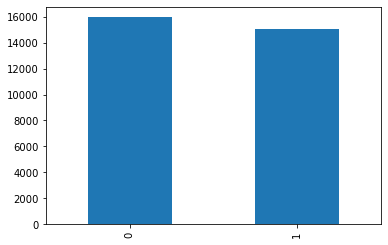

In [73]:
ytrain_bal.value_counts().plot(kind='bar')

## Machine Learning Modelling

#### 1.  LOGISTIC REGRESSION

In [74]:
print(xtrain_bal.shape)
print(ytrain_bal.shape)

(31006, 18)
(31006,)


#### Full Model

In [75]:
log_reg = sm.Logit(ytrain_bal,xtrain_bal).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.123260
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31006
Model:                          Logit   Df Residuals:                    30988
Method:                           MLE   Df Model:                           17
Date:                Tue, 02 Aug 2022   Pseudo R-squ.:                  0.8221
Time:                        19:57:12   Log-Likelihood:                -3821.8
converged:                       True   LL-Null:                       -21479.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
esent                4.2529      0.059     71.539      0.000       4.136       4.369
eopenrate  

In [76]:
odds = pd.DataFrame((np.exp(log_reg.params)),index = xtrain.columns,columns=['ODDS'])
odds

,ODDS
esent,70.308350
eopenrate,0.597519
eclickrate,1.816507
avgorder,0.954108
paperless,1.394999
refill,6.375347
doorstep,6.814029
create_first,0.559671
first_last,0.666004
favday_Monday,2.096108


In [77]:
ypred = log_reg.predict(xtest)
ypred = [1 if i > 0.5 else 0 for i in ypred]

In [78]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.67      0.91      0.77      1906
           1       0.98      0.88      0.93      7335

    accuracy                           0.89      9241
   macro avg       0.82      0.90      0.85      9241
weighted avg       0.91      0.89      0.89      9241



In [79]:
cp =classification_report(ytest,ypred).split()
cp[5],cp[6],cp[7]

('0.67', '0.91', '0.77')

In [80]:
metrics_df = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Base_model']).T
metrics_df

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897


## VIF

In [81]:
vif = [variance_inflation_factor(xtrain_bal.values,i) for i in range(xtrain_bal.shape[1])]

In [82]:
vif_df = pd.DataFrame({'Features':xtrain_bal.columns,'VIF':vif})
vif_df.sort_values('VIF',ascending=False)

,Features,VIF
4,paperless,2.753775
15,city_BOM,2.655769
17,city_MAA,2.521492
16,city_DEL,2.508720
1,eopenrate,2.118318
2,eclickrate,2.084291
9,favday_Monday,1.888699
13,favday_Tuesday,1.828272
0,esent,1.694290
12,favday_Thursday,1.631864


### Feature Selection

In [83]:
LR = LogisticRegression()

In [84]:
## RFE SElection
rfe = RFE(estimator=LR).fit(xtrain_bal,ytrain_bal)

feature_ranking = pd.DataFrame([xtrain_bal.columns,rfe.ranking_],index=['Feature','Ranking']).T
rfe_feat=feature_ranking[feature_ranking.Ranking==1]
rfe_feat.Feature

0               esent
1           eopenrate
2          eclickrate
5              refill
6            doorstep
7        create_first
10    favday_Saturday
11      favday_Sunday
16           city_DEL
Name: Feature, dtype: object

In [85]:
feature_ranking.sort_values('Ranking').reset_index()

,index,Feature,Ranking
0,0,esent,1
1,1,eopenrate,1
2,2,eclickrate,1
3,5,refill,1
4,6,doorstep,1
5,7,create_first,1
6,16,city_DEL,1
7,10,favday_Saturday,1
8,11,favday_Sunday,1
9,14,favday_Wednesday,2


In [86]:
x = xtrain_bal[rfe_feat.Feature]
y= ytrain_bal

rfe_reg = sm.Logit(y,x).fit()
print(rfe_reg.summary())

Optimization terminated successfully.
         Current function value: 0.180335
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31006
Model:                          Logit   Df Residuals:                    30997
Method:                           MLE   Df Model:                            8
Date:                Tue, 02 Aug 2022   Pseudo R-squ.:                  0.7397
Time:                        19:57:42   Log-Likelihood:                -5591.5
converged:                       True   LL-Null:                       -21479.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
esent               3.3772      0.042     80.398      0.000       3.295       3.460
eopenrate     

Confusion Matrix: [[1787  119]
 [1403 5932]]


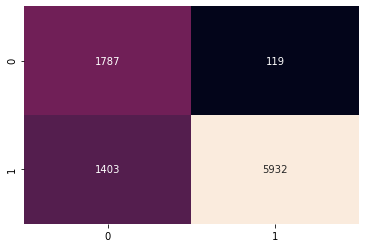

In [87]:
rfe_ypred_test = rfe_reg.predict(xtest[rfe_feat.Feature])
rfe_ypred_test = [1 if i > 0.5 else 0 for i in rfe_ypred_test]
cm_1 = confusion_matrix(ytest,rfe_ypred_test)
print('Confusion Matrix:',cm_1)
sns.heatmap(cm_1,annot=True,cbar=False,fmt='d');

In [88]:
print('RFE Feature selected Logistic Regression:')
print(classification_report(ytest,rfe_ypred_test))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,rfe_ypred_test),2))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))

RFE Feature selected Logistic Regression:
              precision    recall  f1-score   support

           0       0.56      0.94      0.70      1906
           1       0.98      0.81      0.89      7335

    accuracy                           0.84      9241
   macro avg       0.77      0.87      0.79      9241
weighted avg       0.89      0.84      0.85      9241

Cohen Kappa Score: 0.6
ROC AUC Score: 0.873


In [137]:
# The model using rfe features selection gave best result than forward and backward selection techniques

ROC AUC Score: 0.873


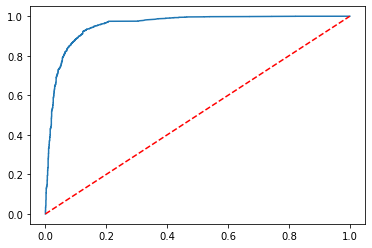

In [89]:
fpr,tpr,th = roc_curve(ytest,rfe_reg.predict(xtest[rfe_feat.Feature]))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [90]:
log_rfe = LogisticRegression().fit(xtrain_bal[rfe_feat.Feature],ytrain_bal)

In [91]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain[rfe_feat.Feature]),
    feature_names=rfe_feat.Feature,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest[rfe_feat.Feature].iloc[1],
    predict_fn=log_rfe.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [92]:
cp = classification_report(ytest,rfe_ypred_test).split()
metrics_df1 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rfe_ypred_test),3),round(roc_auc_score(ytest,rfe_ypred_test),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Rfe_Features_model']).T

metrics_df2 = pd.concat([metrics_df,metrics_df1],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873


<a id="dtree"> </a>
## Decision Tree

In [93]:
dt = DecisionTreeClassifier()

###### Hyperparameter Tuning

In [94]:
params = {'max_depth':[3,4,5],
    'min_samples_split':[2,3,4],
    'min_samples_leaf':[1,2,3],
    'max_leaf_nodes':[13,14,15]}

dt_grid = GridSearchCV(dt,param_grid=params,scoring='accuracy',n_jobs=-1)
dt_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_leaf_nodes': [13, 14, 15],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4]},
             scoring='accuracy')

In [95]:
dt_grid.best_params_

{'max_depth': 5,
 'max_leaf_nodes': 14,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [96]:
tuned_mod = DecisionTreeClassifier(criterion= 'gini', max_depth =  4, max_leaf_nodes =  14, 
                                   min_samples_leaf =  1, min_samples_split =  2)

In [97]:
tuned_mod.fit(xtrain_bal,ytrain_bal)

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=14)

In [98]:
ypred_tuned = tuned_mod.predict(xtest)

In [99]:
feat_imp = pd.DataFrame({'Features':xtest.columns,'Importance':tuned_mod.feature_importances_}).sort_values('Importance',ascending=False)
feat_imp[feat_imp.Importance!=0]

,Features,Importance
0,esent,0.961792
4,paperless,0.011293
7,create_first,0.009955
2,eclickrate,0.009388
1,eopenrate,0.005886
5,refill,0.001408
12,favday_Thursday,0.000278


In [100]:
print('Decision Tree:')
print(classification_report(ytest,ypred_tuned))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),3))
print('ROC AUC Score:',round(roc_auc_score(ytest,tuned_mod.predict_proba(xtest)[:,1]),2))

Decision Tree:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78      1906
           1       0.97      0.90      0.93      7335

    accuracy                           0.90      9241
   macro avg       0.83      0.89      0.86      9241
weighted avg       0.91      0.90      0.90      9241

Cohen Kappa Score: 0.715
ROC AUC Score: 0.91


In [101]:
dot = export_graphviz(tuned_mod,feature_names=xtrain_bal.columns,class_names=['No','Yes'])
graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

InvocationException: GraphViz's executables not found

In [104]:
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),2))

Cohen Kappa Score: 0.71


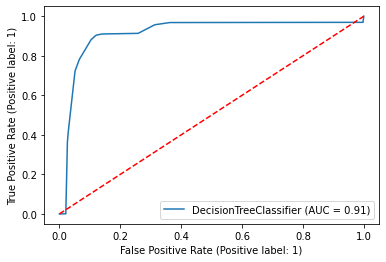

In [105]:
plot_roc_curve(estimator=tuned_mod,X= xtest,y= ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [106]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=tuned_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [107]:
cp = classification_report(ytest,ypred_tuned).split()
metrics_df3 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred_tuned),3),round(roc_auc_score(ytest,ypred_tuned),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Decision_Tree']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df3],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873
Decision_Tree,0.70,0.88,0.78,0.898,0.892


### Random Forest (Bagging)

In [108]:
rf = RandomForestClassifier(n_estimators=250)

In [109]:
params = {'max_depth':np.arange(30,50,5)}

In [110]:
rf_grid = GridSearchCV(estimator=rf,param_grid=params,cv=5,n_jobs=-1)
rf_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=250),
             n_jobs=-1, param_grid={'max_depth': array([30, 35, 40, 45])})

In [111]:
rf_grid.best_params_

{'max_depth': 40}

In [112]:
rf_tuned = RandomForestClassifier(n_estimators=250,max_depth=30).fit(xtrain_bal,ytrain_bal)

In [113]:
print('Random Forest:')
rf_ypred = rf_tuned.predict(xtest)
print(classification_report(ytest,rf_ypred))
print("Cohen Kappa Score:",round(cohen_kappa_score(rf_ypred,ytest),3))

Random Forest:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      1906
           1       0.97      0.96      0.96      7335

    accuracy                           0.94      9241
   macro avg       0.91      0.92      0.92      9241
weighted avg       0.95      0.94      0.94      9241

Cohen Kappa Score: 0.833


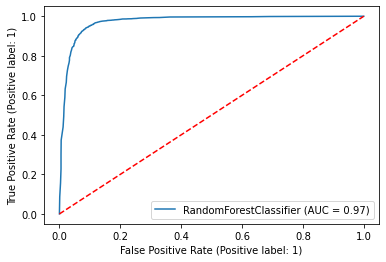

In [114]:
plot_roc_curve(estimator=rf_tuned, X = xtest, y = ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [115]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=rf_tuned.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [116]:
cp = classification_report(ytest,rf_ypred).split()
metrics_df4 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rf_ypred),3),round(roc_auc_score(ytest,rf_ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Random_Forest']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df4],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873
Decision_Tree,0.70,0.88,0.78,0.898,0.892
Random_Forest,0.85,0.89,0.87,0.944,0.924


## Boosting 

### 1.Adaboost

In [117]:
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50)

In [118]:
adaboost.fit(xtrain_bal,ytrain_bal)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier())

In [119]:
ypred_prob = adaboost.predict_proba(xtest)[:,1]

In [120]:
ypred = adaboost.predict(xtest)


In [121]:
print('Adaboost:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

Adaboost:
              precision    recall  f1-score   support

           0       0.56      0.86      0.68      1906
           1       0.96      0.83      0.89      7335

    accuracy                           0.83      9241
   macro avg       0.76      0.84      0.78      9241
weighted avg       0.88      0.83      0.84      9241

Cohen Kappa Score: 0.57


In [122]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

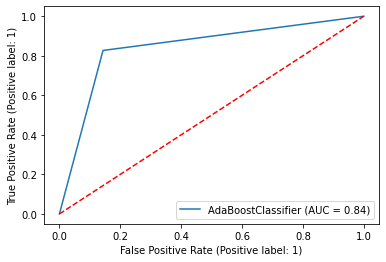

In [123]:
plot_roc_curve(estimator=adaboost,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [124]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=adaboost.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [125]:
cp = classification_report(ytest,ypred).split()
metrics_df5 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['AdaBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df5],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873
Decision_Tree,0.70,0.88,0.78,0.898,0.892
Random_Forest,0.85,0.89,0.87,0.944,0.924
AdaBoost,0.56,0.86,0.68,0.833,0.842


## XG Boost

In [126]:
xgb = XGBClassifier(gamma=1)

In [127]:
xgb.fit(xtrain_bal,ytrain_bal)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=1, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [128]:
ypred =xgb.predict(xtest)
ypred_prob = xgb.predict_proba(xtest)[:,1]

In [129]:
print('XG Boost')
print(classification_report(ytest,ypred))
print('COhen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

XG Boost
              precision    recall  f1-score   support

           0       0.77      0.91      0.83      1906
           1       0.98      0.93      0.95      7335

    accuracy                           0.93      9241
   macro avg       0.87      0.92      0.89      9241
weighted avg       0.93      0.93      0.93      9241

COhen Kappa Score: 0.79


In [130]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

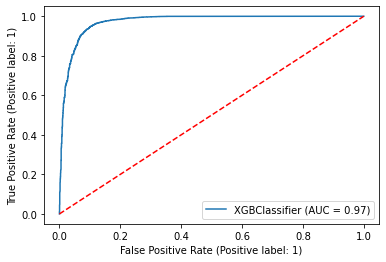

In [131]:
plot_roc_curve(estimator=xgb,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [132]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=xgb.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [133]:
cp = classification_report(ytest,ypred).split()
metrics_df6 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['XGBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df6],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873
Decision_Tree,0.70,0.88,0.78,0.898,0.892
Random_Forest,0.85,0.89,0.87,0.944,0.924
AdaBoost,0.56,0.86,0.68,0.833,0.842
XGBoost,0.77,0.91,0.83,0.925,0.92


## Stacking

In [134]:
base = [('dt',DecisionTreeClassifier()),('rf',RandomForestClassifier())]
stack_mod = StackingClassifier(estimators=base,final_estimator=AdaBoostClassifier())
stack_mod.fit(xtrain_bal,ytrain_bal)

StackingClassifier(estimators=[('dt', DecisionTreeClassifier()),
                               ('rf', RandomForestClassifier())],
                   final_estimator=AdaBoostClassifier())

In [135]:
ypred = stack_mod.predict(xtest)

In [136]:
print('Stacking:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score',round(cohen_kappa_score(ytest,ypred),2))

Stacking:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1906
           1       0.97      0.95      0.96      7335

    accuracy                           0.94      9241
   macro avg       0.90      0.93      0.91      9241
weighted avg       0.94      0.94      0.94      9241

Cohen Kappa Score 0.83


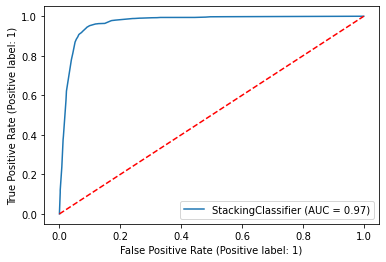

In [137]:
plot_roc_curve(estimator=stack_mod,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')

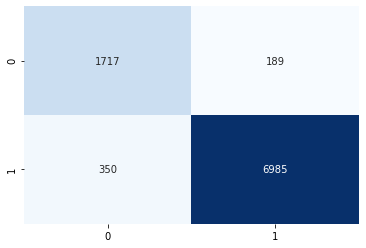

In [138]:
sns.heatmap(confusion_matrix(ytest,ypred),annot=True,fmt='d',cbar=False,cmap='Blues')

In [139]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=stack_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [140]:
cp = classification_report(ytest,ypred).split()
metrics_df7 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Stacking_Reg']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df7],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888,0.897
Rfe_Features_model,0.56,0.94,0.70,0.835,0.873
Decision_Tree,0.70,0.88,0.78,0.898,0.892
Random_Forest,0.85,0.89,0.87,0.944,0.924
AdaBoost,0.56,0.86,0.68,0.833,0.842
XGBoost,0.77,0.91,0.83,0.925,0.92
Stacking_Reg,0.83,0.90,0.86,0.942,0.927


In [141]:
metrics_df2.style.background_gradient(cmap='Blues')

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888000,0.897000
Rfe_Features_model,0.56,0.94,0.70,0.835000,0.873000
Decision_Tree,0.70,0.88,0.78,0.898000,0.892000
Random_Forest,0.85,0.89,0.87,0.944000,0.924000
AdaBoost,0.56,0.86,0.68,0.833000,0.842000
XGBoost,0.77,0.91,0.83,0.925000,0.920000
Stacking_Reg,0.83,0.90,0.86,0.942000,0.927000


In [142]:
metrics_df2.style.highlight_max()

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.67,0.91,0.77,0.888000,0.897000
Rfe_Features_model,0.56,0.94,0.70,0.835000,0.873000
Decision_Tree,0.70,0.88,0.78,0.898000,0.892000
Random_Forest,0.85,0.89,0.87,0.944000,0.924000
AdaBoost,0.56,0.86,0.68,0.833000,0.842000
XGBoost,0.77,0.91,0.83,0.925000,0.920000
Stacking_Reg,0.83,0.90,0.86,0.942000,0.927000
